<font face="B Mitra" size=4>
<div dir=rtl align=center>

<br>
<img src="https://aut.ac.ir/templates/tmpl_modern01/images/logo_fa.png" alt="Amirkabir University Logo" width="100">

<br>
<font size=2>
<b>دانشگاه صنعتی امیرکبیر - دانشکده ریاضی و علوم کامپیوتر</b>
</font>

<br>
<font size=6>
<b>گرافیک کامپیوتری</b>
</font>

<br>
<hr/>
<font size=6>
<b>تمرین پنجم</b>
</font>

<br>
استاد: دکتر مصطفی شمسی

<br>
طراحان:‌ مهرداد صالحی و سینا ارزبین

<hr>
</div>
</font>


<font face="B Mitra" size=5>
<div dir=rtl>

<p>
<font size=4>
لطفا فایل نوت بوک نهایی را با الگوی زیر در سامانه کورسز آپلود کنید.
</font>
</p>

<div dir=ltr>
<font face="Times New Roman" size=4 dir=ltr>
شماره دانشجویی_CG_HW5.ipynb
</font>
</div>

</div>

<div dir=rtl>

<p align="justify">
<font size=4 color="lightblue">
در صورتی که فایل را به صورت لوکال باز‌ می‌کنید، از دستورات مناسب که در فایل تمرین سری اول وجود داشت جهت نمایش تصاویر استفاده کنید.
</font>
</div>
</font>

<font face="B Mitra" size=4>

<hr>
<div dir="rtl">
    <h3>کتابخانه‌های مورد نیاز</h3>
    <p>صرفا سلول زیر را اجرا کنید</p>
</div>
</font>

In [ ]:
import cv2
import requests
from google.colab.patches import cv2_imshow
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def read_image_from_url(url, flags=cv2.IMREAD_COLOR):
    response = requests.get(url)
    response.raise_for_status()
    img_array = np.array(bytearray(response.content), dtype=np.uint8)
    img = cv2.imdecode(img_array, flags)
    return img

<font face="B Mitra" size=4>
    <div dir="rtl">
      <h3>تابع اعمال فیلتر  </h3>
          <p>تابعی بنویسید که با دریافت یک ماتریس ماسک دلخواه و یک تصویر، فیلتر را بر روی آن اعمال کند. همچنین در این تابع از یک نوع padding دلخواه استفاده شود.
          <br>
          <font face="B Mitra" size=4 color='e74c3c'>
          تابع نوشته شده هم باید بر روی تصاویر رنگی و هم تصاویر خاکستری قابل اعمال باشد.
        </font>
           </p>
    </div>
</font>

In [28]:
def apply_filter(image, kernel):
    #TODO: ...
    pad_size = kernel.shape[0] // 2

    # Color Image
    if len(image.shape) == 3:
        padded_image = cv2.copyMakeBorder(image, pad_size//2, pad_size//2, pad_size//2, pad_size//2, cv2.BORDER_REFLECT)
        filtered_image = np.zeros_like(padded_image, dtype=np.float32)
        for channel in range(image.shape[2]):
            for i in range(pad_size, padded_image.shape[0] - pad_size):
                for j in range(pad_size, padded_image.shape[1] - pad_size):
                    window = padded_image[i-pad_size : i+pad_size+1, j-pad_size : j+pad_size+1, channel]
                    filtered_image[i, j, channel] = np.sum(window * kernel)
        filtered_image = filtered_image[pad_size:-pad_size, pad_size:-pad_size, :]

    # Grayscale Image
    else:
        padded_image = cv2.copyMakeBorder(image, pad_size//2, pad_size//2, pad_size//2, pad_size//2, cv2.BORDER_REFLECT)
        filtered_image = np.zeros_like(padded_image, dtype=np.float32)
        for i in range(pad_size, padded_image.shape[0] - pad_size):
            for j in range(pad_size, padded_image.shape[1] - pad_size):
                window = padded_image[i-pad_size:i+pad_size+1, j-pad_size:j+pad_size+1]
                filtered_image[i, j] = np.sum(window * kernel)
        filtered_image = filtered_image[pad_size:-pad_size, pad_size:-pad_size]

    filtered_image = np.clip(filtered_image, 0, 255).astype(np.uint8)

    return filtered_image

<font face="B Mitra" size=4>
    <div dir="rtl">
          <p>
          با استفاده از تابع اعمال فیلتری که در بخش قبل نوشته‌اید، فیلتر زیر را بر روی تصویر موجود در بلاک زیر اعمال کنید و سپس تصویر اولیه و تصویر حاصل را در کنار هم نمایش دهید.
          <br>
          </div>
</font>

\begin{bmatrix}
0 & -1 & 0 \\
-1 & 5 & -1 \\
0 & -1 & 0
\end{bmatrix}

    

In [29]:
image = read_image_from_url("https://i.ibb.co/QXQx81x/D.jpg") # it's a color image

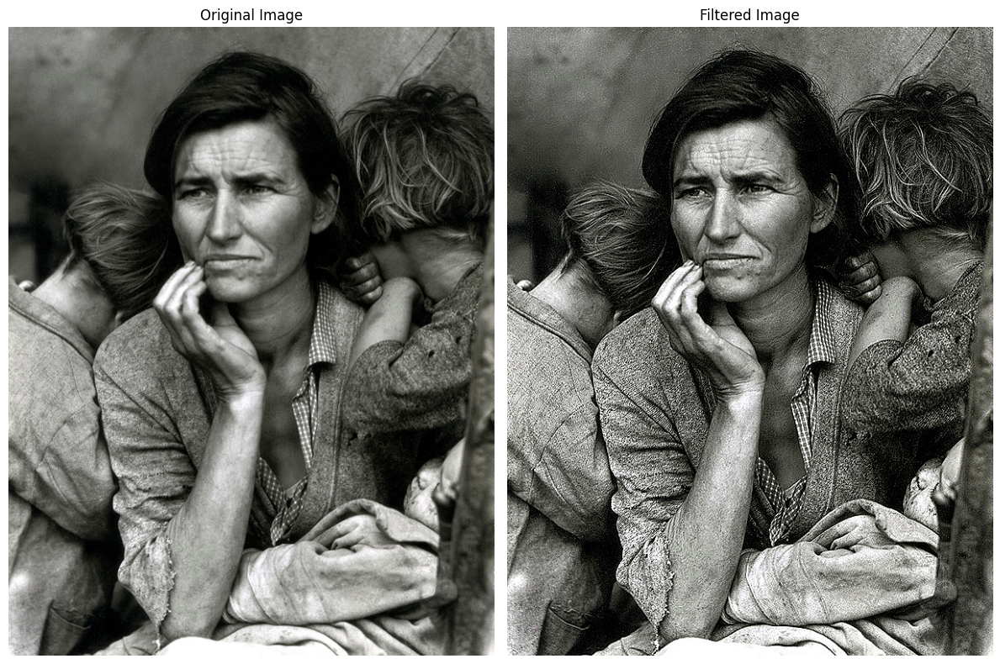

In [30]:
#TODO: apply the filter to the image
kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]], dtype=np.float32)
filtered_image = apply_filter(image, kernel)

fig, axs = plt.subplots(1,2, figsize=(12, 8)) # use these figure and axes to show the images

#TODO: show the original image and the filtered image
axs[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axs[0].set_title('Original Image')
axs[0].axis('off')

axs[1].imshow(cv2.cvtColor(filtered_image, cv2.COLOR_BGR2RGB))
axs[1].set_title('Filtered Image')
axs[1].axis('off')

plt.tight_layout()
plt.show()

<font face="B Mitra" size=4>
    <div dir="rtl">
        <p>
        تصویر حاصل چه تفاوتی با تصویر اولیه دارد؟ چرا فیلتر گفته شده باعث ایجاد این تغییرات می‌شود؟
        </p>
    </div>
    
</font>

<div dir=rtl>
<p>
<font face="B Mitra" size=5, color='cyan'>
فیلتر به کار رفته، یک فیلتر Unsharpen می‌باشد که برای افزایش وضوح و برجستگی لبه‌ها در تصویر به کار می‌رود که پس از اعمال آن بر روی تصویر اولیه، تصویر حاصل دارای لبه‌های تیزتر و جزئیات بیشتری می‌باشد. این به دلیل آن است که فیلتر Unsharpen تفاوت بین پیکسل مرکزی و پیکسل‌های اطراف را افزایش می‌دهد (در واقع مقدار پیکسل مرکزی را افزایش و مقادیر پیکسل‌های اطراف را کاهش می‌دهد) که منجر به تغییراتی همچون افزایش وضوح و کنتراست بالاتر می‌شود.
</p>
</font>
</div>
<hr>

<font face="B Mitra" size=4>
    <div dir="rtl">
    <h3>فیلتر لاپلاسین</h3>
          <p>تابعی بنویسید که با دریافت
          α،
          فیلتر لاپلاسین متناظر با آن را به صورت
          numpy array
          خروجی دهد.<br>
          فیلتر لاپلاسین:
          </div>
<br>
</font>

\begin{bmatrix}
\frac{\alpha}{1+\alpha} & \frac{1-\alpha}{1+\alpha} & \frac{\alpha}{1+\alpha} \\[8pt]
\frac{1-\alpha}{1+\alpha} & \frac{-4}{1+\alpha} & \frac{1-\alpha}{1+\alpha} \\[8pt]
\frac{\alpha}{1+\alpha} & \frac{1-\alpha}{1+\alpha} & \frac{\alpha}{1+\alpha}
\end{bmatrix}


In [31]:
def create_laplacian_kernel(alpha):
    #TODO: ...
    row1 = [alpha / (1 + alpha), (1 - alpha) / (1 + alpha), alpha / (1 + alpha)]
    row2 = [(1 - alpha) / (1 + alpha), -4 / (1 + alpha), (1 - alpha) / (1 + alpha)]
    row3 = [alpha / (1 + alpha), (1 - alpha) / (1 + alpha), alpha / (1 + alpha)]
    laplacian_kernel = np.array([row1, row2, row3], dtype=np.float32)
    return laplacian_kernel

<font face="B Mitra" size=4>
    <div dir="rtl">
          <p>فیلترهای لاپلاسین با آلفاهای مختلف را ساخته و روی تصویر زیر اعمال کنید. درنهایت تصویر اصلی و خروجی اعمال هر فیلتر را کنار هم نمایش دهید.
            <br>
          <font face="B Mitra" size=4 color='e74c3c'>
             با آلفاهای 1 و 0.5 و 0 امتحان کنید.
        </font>
          </p>
          </div>
<br>
</font>

In [32]:
image = read_image_from_url('https://i.ibb.co/pJ705Ln/eiffel.jpg', cv2.IMREAD_GRAYSCALE)

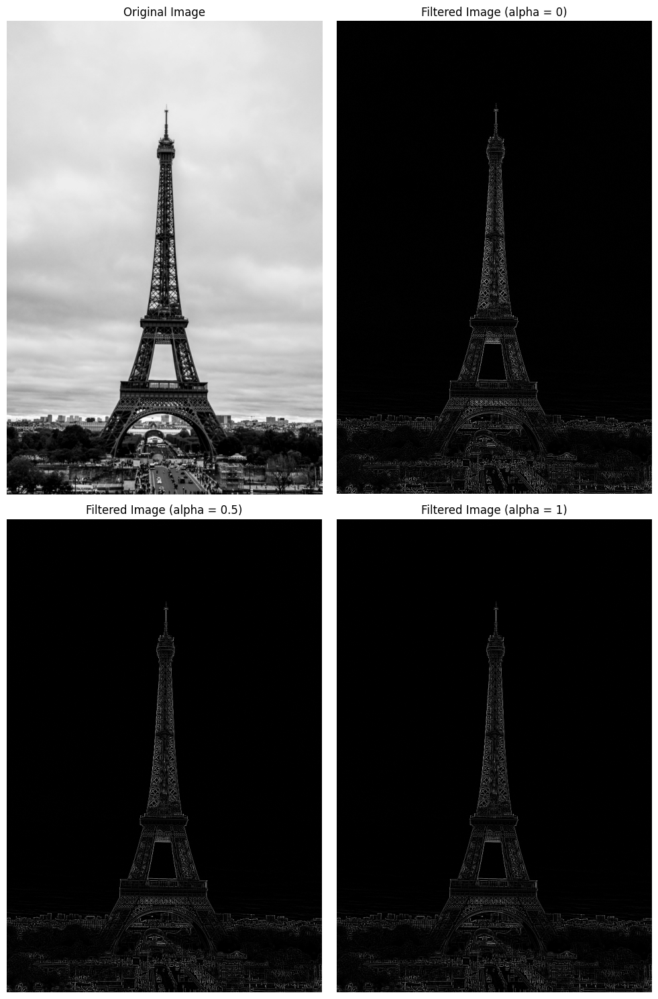

In [33]:
#TODO: apply the filters to the image
first_filtered_image = apply_filter(image, kernel=create_laplacian_kernel(0))
second_filtered_image = apply_filter(image, kernel=create_laplacian_kernel(0.5))
third_filtered_image = apply_filter(image, kernel=create_laplacian_kernel(1))

fig, axs = plt.subplots(2,2, figsize=(10, 15)) # use these figure and axes to show the images

#TODO: show the original image and the filtered image
axs[0][0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axs[0][0].set_title('Original Image')
axs[0][0].axis('off')

axs[0][1].imshow(cv2.cvtColor(first_filtered_image, cv2.COLOR_BGR2RGB))
axs[0][1].set_title('Filtered Image (alpha = 0)')
axs[0][1].axis('off')

axs[1][0].imshow(cv2.cvtColor(second_filtered_image, cv2.COLOR_BGR2RGB))
axs[1][0].set_title('Filtered Image (alpha = 0.5)')
axs[1][0].axis('off')

axs[1][1].imshow(cv2.cvtColor(third_filtered_image, cv2.COLOR_BGR2RGB))
axs[1][1].set_title('Filtered Image (alpha = 1)')
axs[1][1].axis('off')

plt.tight_layout()
plt.show()

<font face="B Mitra" size=4>
    <div dir="rtl">
          <p>
            پارامتر آلفا چه تاثیری بر روی خروجی دارد؟ آیا تغییر آن باعث تشخیص لبه‌های مختلف می‌شود؟
          </p>
          </div>
</font>

<div dir=rtl>
<p>
<font face="B Mitra" size=5, color='cyan'>
فیلتر لاپلاسین لبه‌های نازکی را تولید می‌کند و نسبت به جزئیات کوچک مانند خط‌های نازک حساسیت بالایی دارد. این فیلتر به ازای آلفاهای متفاوت، تقریبا یکسان عمل می‌کند و خروجی‌ها صرفا تفاوت جزئی با هم دارند.
به صورت کلی هر چقدر مقدار آلفا کم‌تر باشد، بر روی تغییرات ناگهانی در شدت روشنایی تمرکز بیش‌تری می‌شود و نویز تصویر را برجسته‌تر می‌کند و به همین خاطر نویز بیش‌تری را به عنوان لبه شناسایی می‌کند و لبه‌ها ضخیم‌تر به نظر می‌رسند.
</p>
</font>
</div>
<hr>

<font face="B Mitra" size=4>
    <h2 style="text-align: center;">Sobel edge detection</h2>
    <div dir="rtl">
           <p>
    الگوریتم سوبل را پیاده سازی کرده و بر روی تصویر زیر اعمال کنید.
    برای ترکیب دو ماسک افقی و عمودی دو رویکرد
    مجموع قدر مطلق آن‌ها و روش دیگر که از محموع مجذور آن‌ها رادیکال می گیرد را پیاده سازی کنید. در نهایت خروجی هر دو روش را به همراه تصویر اصلی نمایش دهید.
<font face="B Mitra" size=4 color='e74c3c'>
           پیاده سازی را خودتان باید انجام دهید و نیاز به استفاده از توابع OpenCV نیست.
        </font>
</p>
    </div>
</font>

In [34]:
image = read_image_from_url('https://i.ibb.co/pJ705Ln/eiffel.jpg', cv2.IMREAD_GRAYSCALE)

In [36]:
def sobel_edge_detection(gray_image, mode): # mode can be abs or sqrt
    #TODO: ...
    sobel_mask_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=np.float32)
    sobel_mask_y = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], dtype=np.float32)

    gradient_x = np.zeros_like(gray_image, dtype=np.float32)
    gradient_y = np.zeros_like(gray_image, dtype=np.float32)

    padded_image = np.pad(gray_image, ((1, 1), (1, 1)), mode='constant', constant_values=0)

    for i in range(1, gray_image.shape[0] + 1):
        for j in range(1, gray_image.shape[1] + 1):
            window = padded_image[i-1 : i+2, j-1 : j+2]
            gradient_x[i-1, j-1] = np.sum(window * sobel_mask_x)
            gradient_y[i-1, j-1] = np.sum(window * sobel_mask_y)

    if mode == 'abs':
        final_image = np.abs(gradient_x) + np.abs(gradient_y)
    elif mode == 'sqrt':
        final_image = np.sqrt(np.square(gradient_x) + np.square(gradient_y))

    final_image = np.clip(final_image, 0, 255).astype(np.uint8)

    return final_image

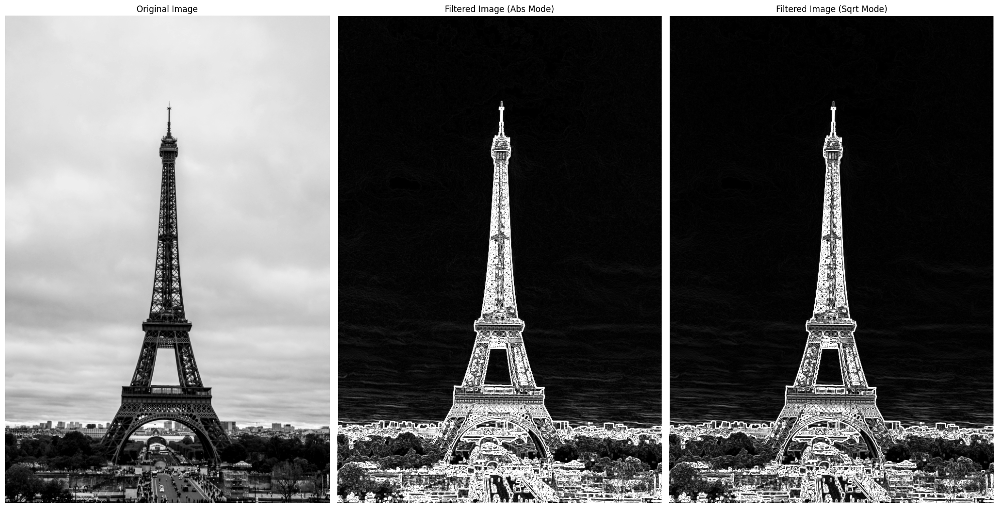

In [37]:
#TODO: apply the filters to the image
sobel_abs_image = sobel_edge_detection(image, 'abs')
sobel_sqrt_image = sobel_edge_detection(image, 'sqrt')

fig, axs = plt.subplots(1,3, figsize=(20, 20)) # use these figure and axes to show the images

#TODO: show the original image and the filtered images
axs[0].imshow(image, cmap='gray')
axs[0].set_title('Original Image')
axs[0].axis('off')

axs[1].imshow(sobel_abs_image, cmap='gray')
axs[1].set_title('Filtered Image (Abs Mode)')
axs[1].axis('off')

axs[2].imshow(sobel_sqrt_image, cmap='gray')
axs[2].set_title('Filtered Image (Sqrt Mode)')
axs[2].axis('off')

plt.tight_layout()
plt.show()

<font face="B Mitra" size=4>
    <div dir="rtl">
           <p>
    آیا این دو رویکرد روی تصویر مورد نظر تفاوت محسوسی دارند؟ استفاده از کدام روش را پیشنهاد می‌دهید؟ چرا؟
</p>
    </div>
</font>

<div dir=rtl>
<p>
<font face="B Mitra" size=5, color='cyan'>
نتایج هر دو رویکرد تقریبا یکسان است و صرفا تفاوت‌های جزئی بین دو تصویر خروجی وجود دارد؛ اما در هر صورت واضح است که روش sqrt نتیجه‌ی بهتری دارد و لبه‌ها را دقیق‌تر نشان می‌دهد.
<br>
معمولا روش sqrt به دلیل نمایش دقیق‌تر و نرم‌تر لبه‌ها و کاهش نویز پیشنهاد می‌شود، به خصوص اگر کیفیت بالای تصویر و دقت بیش‌تر اهمیت داشته باشد. روش abs سریع‌تر است و هزینه‌ی محاسباتی کم‌تری دارد و لبه‌ها را تیزتر نشان می‌دهد، اما ممکن است نویز تصویر را بیش‌تر برجسته کند. پس اگر اولویت با کیفیت بهتر تصویر خروجی است، روش sqrt پیشنهاد می‌شود، اما اگر نتیجه‌ی تقریبا یکسان (کیفیت کمی پایین‌تر) ولی با پردازش سریع‌تر می‌خواهیم روش abs را استفاده می‌کنیم.</p>
</font>
</div>
<hr>

<font face="B Mitra" size=4>
<div dir="rtl">
<h2 style="text-align: center;">Prewitt edge detection</h2>
<p>
الگوریتم <b>Prewitt</b> یکی دیگر از روش‌های پایه برای تشخیص لبه‌ها در تصاویر است. این الگوریتم مشابه الگوریتم سوبل از دو ماسک استفاده می‌کند:
یکی برای محاسبه گرادیان در جهت افقی (<b>G<sub>x</sub></b>) و دیگری برای محاسبه گرادیان در جهت عمودی (<b>G<sub>y</sub></b>).

ماسک‌های Prewitt:
</p>
</div>

</font>

$$

G_y =
\begin{bmatrix}
-1 & 0 & 1 \\
-1 & 0 & 1 \\
-1 & 0 & 1
\end{bmatrix}
G_x =
\begin{bmatrix}
-1 & -1 & -1 \\
0 & 0 & 0 \\
1 & 1 & 1
\end{bmatrix}

$$

<font face="B Mitra" size=4>
<div dir="rtl">
با ترکیب این دو گرادیان می‌توان لبه‌هایی که در هر جهتی هستند را پیدا کرد.
ترکیب این دو مانند ترکیب در سوبل با همان دو روش انجام می شود به دلخواه با یکی از دو روش الگوریتم را پیاده سازی کنید و روی
تصویر قبل اعمال کنید و نتیجه را به همراه نتیجه الگوریتم سوبل و تصویر اصلی نمایش دهید.


In [38]:
def prewitt_edge_detection(gray_image):
    #TODO: ...
    prewitt_mask_x = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]], dtype=np.float32)
    prewitt_mask_y = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]], dtype=np.float32)

    gradient_x = np.zeros_like(gray_image, dtype=np.float32)
    gradient_y = np.zeros_like(gray_image, dtype=np.float32)

    padded_image = np.pad(gray_image, ((1, 1), (1, 1)), mode='constant', constant_values=0)

    for i in range(1, gray_image.shape[0] + 1):
        for j in range(1, gray_image.shape[1] + 1):
            window = padded_image[i-1 : i+2, j-1 : j+2]
            gradient_x[i-1, j-1] = np.sum(window * prewitt_mask_x)
            gradient_y[i-1, j-1] = np.sum(window * prewitt_mask_y)

    final_image = np.sqrt(np.square(gradient_x) + np.square(gradient_y))
    final_image = np.clip(final_image, 0, 255).astype(np.uint8)

    return final_image

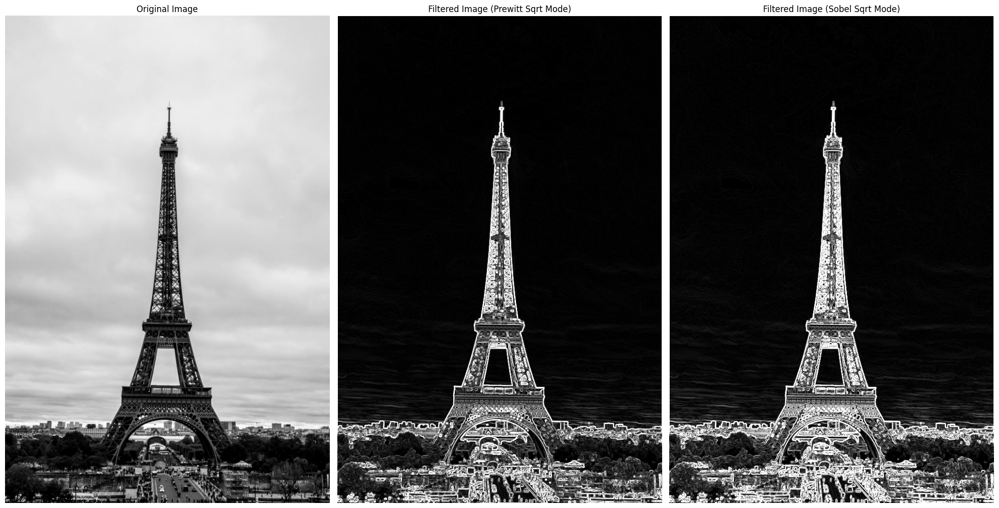

In [39]:
#TODO: apply the filter to the image
prewitt_image = prewitt_edge_detection(image)

fig, axs = plt.subplots(1,3, figsize=(20, 20)) # use these figure and axes to show the images

#TODO: show the original image and the filtered images
axs[0].imshow(image, cmap='gray')
axs[0].set_title('Original Image')
axs[0].axis('off')

axs[1].imshow(prewitt_image, cmap='gray')
axs[1].set_title('Filtered Image (Prewitt Sqrt Mode)')
axs[1].axis('off')

axs[2].imshow(sobel_sqrt_image, cmap='gray')
axs[2].set_title('Filtered Image (Sobel Sqrt Mode)')
axs[2].axis('off')

plt.tight_layout()
plt.show()

<div dir=rtl>
<p>
<font face="B Mitra" size=4>
خروجی الگوریتم Prewitt چه تفاوتی با خروجی الگوریتم Sobel دارد؟ دلیل این تفاوت از نظر شما چیست؟
</p>
</font>
</div>

<div dir=rtl>
<p>
<font face="B Mitra" size=5, color='cyan'>
 الگوریتم Sobel با استفاده از ماتریس‌های ماسک با وزن‌های متفاوت (شامل درایه‌های با مقدار 2) لبه‌ها را با دقت و برجستگی بیشتری نشان می‌دهد. به دلیل این وزن‌ها، نویز کمتری در تصویر نهایی مشاهده می‌شود و لبه‌ها واضح‌تر و ضخیم‌تر هستند.
 الگوریتم Prewitt با ماتریس‌های ماسک ساده‌تری که وزن ثابت 1 دارند، لبه‌ها را به صورت کمی نرم‌تر و با وضوح کمتری نسبت به Sobel نشان می‌دهد.
<br>
به صورت کلی، الگوریتم Sobel به دلیل دقت بالاتر در تشخیص لبه‌ها و کاهش نویز، بیش‌تر استفاده می‌شود. در مقابل، الگوریتم Prewitt ساده‌تر است و برای پردازش‌های سریع‌تر و زمانی که دقت بالا نیاز نیست، ممکن است مناسب‌تر باشد.
</p>
</font>
</div>
<hr>

<font face="B Mitra" size=4>
<h2 style="text-align: center;">Canny edge detection</h2>
<div dir="rtl">

الگوریتم Canny edge detection یک فرایند چندمرحله‌ای است که برای شناسایی لبه‌ها در یک تصویر طراحی شده است. این الگوریتم ابتدا نویزهای تصویر را با اعمال یک فیلتر کاهش می‌دهد، سپس مکان‌هایی که تغییرات شدیدی در شدت روشنایی (لبه‌ها) وجود دارند را شناسایی می‌کند و در نهایت لبه‌ها را تقویت کرده و واضح‌تر می‌کند. مراحل اصلی فرآیند Canny edge detection به شرح زیر است:
<br>

<h3>۱. Gaussian Blurring</h3>
اولین مرحله اعمال Gaussian blur به تصویر ورودی است. این کار برای کاهش نویز انجام می‌شود که به جلوگیری از شناسایی لبه‌های نادرست در مراحل بعدی کمک می‌کند.

<br>

<h3>۲. Gradient Calculation</h3>
در مرحله بعد، gradient تصویر با استفاده از فیلترهای Sobel محاسبه می‌شود. گرادیان در هر پیکسل به ما نشان می‌دهد که شدت تصویر در دو جهت x (افقی) و y (عمودی) چقدر تغییر کرده است.
<br>

<h4>Magnitude و Direction Gradient</h4>

- Magnitude Gradient: مقدار گرادیان با استفاده از فرمول زیر محاسبه می‌شود:
</div>
<pre>

$$ \text{Magnitude} = \sqrt{G_x^2 + G_y^2} $$
</pre>

<div dir=rtl>

که در آن:
- \( G_x \) گرادیان در جهت x (افقی).
- \( G_y \) گرادیان در جهت y (عمودی).
<br>

مقدار گرادیان نشان می‌دهد که شدت لبه در هر پیکسل چقدر قوی است.
<br>

- Direction Gradient: جهت لبه به صورت زیر محاسبه می‌شود:
</div>

$$ \theta = atan2(G_y, G_x) $$
<div dir=rtl>

که در آن `atan2` زاویه بین محور x و برداری که توسط گرادیان‌های \( G_x \) و \( G_y \) نشان داده شده است، را برمی‌گرداند. این زاویه برای تعیین جهت لبه در آن پیکسل استفاده می‌شود.
<br>

Quantizing the Gradient Direction: جهت گرادیان می‌تواند هر مقداری بین ۰° و ۱۸۰° باشد؛ اما برای ساده‌تر شدن، این زاویه‌ها به ۴ جهت اصلی تقسیم می‌شوند:
- ۰°: لبه افقی (چپ به راست).
- ۴۵°: لبه قطری (بالا چپ به پایین راست).
- ۹۰°: لبه عمودی (بالا به پایین).
- ۱۳۵°: لبه قطری (بالا راست به پایین چپ).

این ۴ جهت باعث می‌شود که فرایند تشخیص لبه سریع‌تر و کارآمدتر انجام شود.
<br>

<h3>۳. Non-Maximum Suppression (NMS)</h3>
حالا که مقدار و جهت گرادیان را داریم، مرحله بعدی Non-Maximum Suppression (NMS) است. هدف NMS این است که لبه‌ها را نازک‌تر کرده و تنها حداکثر‌های محلی در جهت گرادیان را نگه داریم.
<br>

- هدف: حذف پیکسل‌هایی که نمایانگر قوی‌ترین لبه در جهت خود نیستند، که منجر به لبه‌هایی نازک‌تر و دقیق‌تر می‌شود.
<br>

نحوه عملکرد NMS:
1. برای هر پیکسل در تصویر گرادیان، در جهت گرادیان آن به پیکسل‌های همسایه نگاه می‌کنیم.
2. مقایسه مقدار گرادیان پیکسل فعلی با دو همسایه‌اش در جهت گرادیان.
- اگر مقدار گرادیان پیکسل فعلی از هر دو همسایه‌اش بزرگ‌تر باشد، نگه داشته می‌شود (به عنوان حداکثر محلی در نظر گرفته می‌شود).
- اگر مقدار گرادیان پیکسل فعلی از یکی از همسایه‌ها کوچک‌تر باشد، حذف می‌شود (صفر می‌شود).

برای مثال:
- اگر جهت گرادیان یک پیکسل ۰° باشد (لبه افقی)، دو همسایه آن پیکسل به چپ و پیکسل به راست خواهند بود.
- اگر جهت گرادیان ۴۵° باشد (لبه قطری)، دو همسایه آن پیکسل، پیکسل بالای چپ و پیکسل پایین راست خواهند بود.

این فرایند تضمین می‌کند که تنها قوی‌ترین گرادیان‌ها در طول لبه‌ها نگه داشته شوند و تمامی پیکسل‌های دیگر حذف شوند.
<br>

<h3>۴. Double Thresholding</h3>
مرحله بعدی Double Thresholding است. این مرحله کمک می‌کند تا پیکسل‌های لبه را به سه دسته تقسیم کنیم: لبه‌های قوی، لبه‌های ضعیف و غیر لبه‌ها.
<br>

- هدف: تفکیک لبه‌های قوی و قطعی از لبه‌های ضعیف و مبهم.


نحوه عملکرد Double Thresholding:
1. لبه‌های قوی: پیکسل‌هایی که مقدار گرادیانشان بالاتر از آستانه بالا (مثلاً ۱۵۰) باشد به عنوان لبه‌های قوی در نظر گرفته می‌شوند. این‌ها لبه‌های قطعی هستند.
2. لبه‌های ضعیف: پیکسل‌هایی که مقدار گرادیانشان بین آستانه پایین (مثلاً ۵۰) و آستانه بالا قرار دارند به عنوان لبه‌های ضعیف در نظر گرفته می‌شوند. این پیکسل‌ها ممکن است جزئی از یک لبه باشند، اما به اندازه کافی قوی نیستند.
3. غیر لبه‌ها: پیکسل‌هایی که مقدار گرادیانشان پایین‌تر از آستانه پایین است، به عنوان غیر لبه‌ها در نظر گرفته می‌شوند و حذف می‌شوند.
این مرحله به طور مؤثری لبه‌های قوی را نگه می‌دارد و لبه‌های ضعیف را برای بررسی بیشتر علامت‌گذاری می‌کند.

<h3>۵. Edge Tracking by Hysteresis</h3>
این مرحله نتیجه Double Thresholding را می‌گیرد و لبه‌های نهایی را با تصمیم‌گیری در مورد اینکه آیا لبه‌های ضعیف باید نگه داشته شوند یا حذف شوند، نهایی می‌کند.
این مرحله تضمین می‌کند که لبه‌های ضعیفی که جزء یک شیء یا مرز پیوسته هستند (اما کمتر برجسته) نگه داشته شوند.

<br>

- هدف: اتصال لبه‌های ضعیفی که جزئی از لبه‌های قوی هستند و حذف لبه‌های ضعیفی که جدا افتاده‌اند.
<br>

نحوه عملکرد Edge Tracking by Hysteresis:
1. مرحله اول: هر پیکسل که به عنوان لبه قوی از مرحله قبل شناخته شده باشد، نگه داشته می‌شود.
2. مرحله دوم: هر پیکسل که به عنوان لبه ضعیف شناخته شده باشد، بررسی می‌شود تا ببیند که آیا به یک لبه قوی متصل است یا خیر. اگر متصل باشد، لبه ضعیف به عنوان بخشی از   لبه‌های نهایی نگه داشته می‌شود.
3. مرحله سوم: هر لبه ضعیفی که به لبه قوی متصل نیست حذف می‌شود (صفر می‌شود)، زیرا احتمالاً نویز یا لبه‌ای غیرمعتبر است.

<font face="B Mitra" size=5 color='e74c3c'>
    الگوریتم Canny را مطابق با توضیحات بالا پیاده سازی کنید.
    <br>
    برای تشکیل ماسک گوسی می‌توانید از توابع موجود در کتابخانه OpenCV استفاده کنید اما برای اعمال آن بر روی تصویر از تابع خودتان استفاده کنید.
</font>
</div>
</font>


In [40]:
def canny_edge_detection(image, low_thresh=50, high_thresh=100, kernel_size=5, sigma=1):
    # Step 1: Gaussian Blur to reduce noise
    def gaussian_blur(img, kernel_size, sigma):
        #TODO: ...
        a = cv2.getGaussianKernel(kernel_size, sigma)
        b = a
        kernel = np.outer(a, b)
        return apply_filter(img, kernel)

    # Step 2: Compute gradient magnitudes and directions using Sobel operator
    def sobel_gradients(img):
        #TODO: ...
        sobel_mask_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=np.float32)
        sobel_mask_y = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], dtype=np.float32)
        gradient_x = np.zeros_like(img, dtype=np.float32)
        gradient_y = np.zeros_like(img, dtype=np.float32)

        padded_image = np.pad(img, ((1, 1), (1, 1)), mode='constant', constant_values=0)

        for i in range(1, img.shape[0] + 1):
            for j in range(1, img.shape[1] + 1):
                window = padded_image[i-1 : i+2, j-1 : j+2]
                gradient_x[i-1, j-1] = np.sum(window * sobel_mask_x)
                gradient_y[i-1, j-1] = np.sum(window * sobel_mask_y)

        magnitude = np.sqrt(gradient_x**2 + gradient_y**2)
        angle = np.arctan2(gradient_y, gradient_x)

        return magnitude, angle

    # Step 3: Non-Maximum Suppression
    def non_maximum_suppression(magnitude, angle):
        angle = np.rad2deg(angle) % 180
        #TODO: ...
        result = np.zeros_like(magnitude, dtype=np.uint8)
        for i in range(1, magnitude.shape[0] - 1):
            for j in range(1, magnitude.shape[1] - 1):
                n1 = 255
                n2 = 255

                # Horizontal Edge (Left to Right)
                if (0 <= angle[i, j] < 22.5) or (157.5 <= angle[i, j] <= 180):
                    n1 = magnitude[i, j + 1]
                    n2 = magnitude[i, j - 1]

                # Diagonal Edge (Top Right to Bottom Left)
                elif 22.5 <= angle[i, j] < 67.5:
                    n1 = magnitude[i + 1, j - 1]
                    n2 = magnitude[i - 1, j + 1]

                # Vertical Edge (Top to Bottom)
                elif 67.5 <= angle[i, j] < 112.5:
                    n1 = magnitude[i + 1, j]
                    n2 = magnitude[i - 1, j]

                # Diagonal Edge (Top Left to Bottom Right)
                elif 112.5 <= angle[i, j] < 157.5:
                    n1 = magnitude[i - 1, j - 1]
                    n2 = magnitude[i + 1, j + 1]

                if (magnitude[i, j] >= n1) and (magnitude[i, j] >= n2):
                    result[i, j] = magnitude[i, j]
                else:
                    result[i, j] = 0

        return result

    # Step 4: Double Thresholding
    def double_threshold(img, low_thresh, high_thresh):
        strong, weak = 255, 100 # use these values to represent strong and weak edges
        #TODO: ...
        output = np.zeros_like(img, dtype=np.uint8)
        output[np.where(img >= high_thresh)] = strong
        output[np.where((img <= high_thresh) & (img >= low_thresh))] = weak
        return output, strong, weak

    # Step 5: Edge Tracking by Hysteresis
    def edge_tracking_by_hysteresis(img, strong, weak):
        #TODO: ...
        for i in range(1, img.shape[0] - 1):
            for j in range(1, img.shape[1] - 1):
                if (img[i, j] == weak):
                    if ((img[i + 1, j - 1] == strong) or (img[i + 1, j] == strong) or (img[i + 1, j + 1] == strong)
                            or (img[i, j - 1] == strong) or (img[i, j + 1] == strong)
                            or (img[i - 1, j - 1] == strong) or (img[i - 1, j] == strong) or (img[i - 1, j + 1] == strong)):
                        img[i, j] = strong
                    else:
                        img[i, j] = 0
        return img

    # Main process
    #TODO: ...
    blurred_image = gaussian_blur(image, kernel_size, sigma)
    magnitude, angle = sobel_gradients(blurred_image)
    suppressed_image = non_maximum_suppression(magnitude, angle)
    thresholded_image, strong, weak = double_threshold(suppressed_image, low_thresh, high_thresh)
    final_image = edge_tracking_by_hysteresis(thresholded_image, strong, weak)

    return final_image

<div dir=rtl>
<p>
<font face="B Mitra" size=4>
با استفاده از الگوریتم Canny edge detection، لبه‌های تصویر زیر را بیابید و نتیجه را به همراه نتیجه الگوریتم سوبل و تصویر اصلی نمایش دهید.
</p>
</font>
</div>

In [43]:
image = read_image_from_url('https://i.ibb.co/pJ705Ln/eiffel.jpg', cv2.IMREAD_GRAYSCALE)

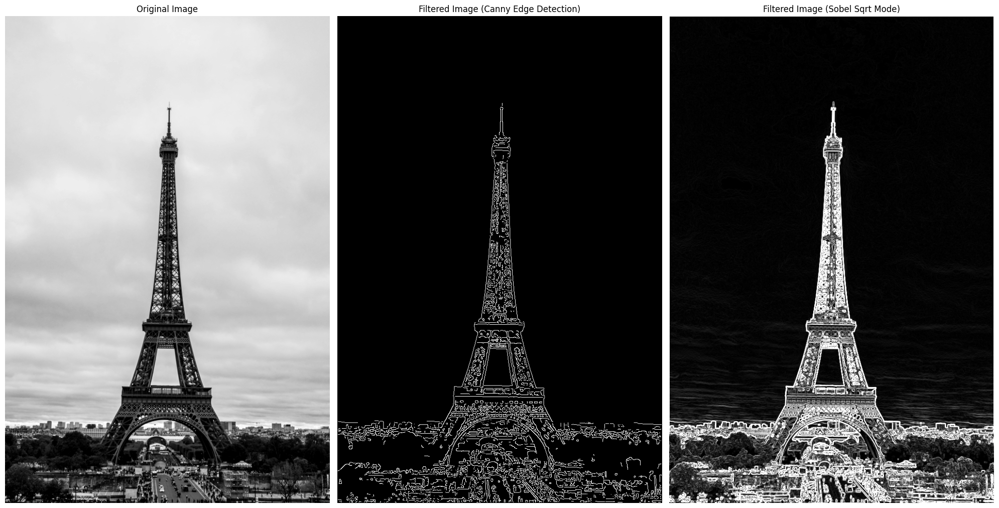

In [44]:
#TODO: apply the filter to the image
canny_image = canny_edge_detection(image)

fig, axs = plt.subplots(1,3, figsize=(20, 20)) # use these figure and axes to show the images

#TODO: show the original image and the filtered images
axs[0].imshow(image, cmap='gray')
axs[0].set_title('Original Image')
axs[0].axis('off')

axs[1].imshow(canny_image, cmap='gray')
axs[1].set_title('Filtered Image (Canny Edge Detection)')
axs[1].axis('off')

axs[2].imshow(sobel_sqrt_image, cmap='gray')
axs[2].set_title('Filtered Image (Sobel Sqrt Mode)')
axs[2].axis('off')

plt.tight_layout()
plt.show()

<div dir=rtl>
<p>
<font face="B Mitra" size=4>
به نظر شما کدام الگوریتم عملکرد بهتری داشته است؟
به طور مختصر توضیح دهید که هر کدام از گام‌های الگوریتم Canny چگونه بر روی نتیجه حاصل شده تاثیر گذاشته‌اند.
</p>
</font>
</div>

<div dir=rtl>
<p>
<font face="B Mitra" size=5, color='cyan'>
الگوریتم Canny لبه‌ها را بسیار واضح‌تر و دقیق‌تر نسبت به الگوریتم Sobel نشان می‌دهد و همچنین باعث کاهش نویز تصویر خروجی می‌شود؛ بنابراین الگوریتم Canny عملکرد بهتری داشته است. پس با وجود آن که الگوریتم Sobel سریع‌تر و ساده‌تر از الگوریتم Canny است، اما دقت کم‌تر و نویز بیش‌تری دارد.
<br>
تاثیر هر کدام از گام‌های الگوریتم Canny بر روی نتیجه:
<br>
1- Gaussian Blurring: این مرحله برای کاهش نویز تصویر به کار می‌رود. با کاهش نویز، از شناسایی لبه‌های نادرست جلوگیری می‌شود. این مرحله باعث می‌شود که لبه‌های نهایی دقیق‌تر و کم نویزتر باشند.
<br>
2- Gradient Calculation: گرادیان‌های تصویر مکان‌هایی را که تغییرات شدیدی در شدت روشنایی دارند، مشخص می‌کنند. این اطلاعات برای تشخیص لبه‌های دقیق‌تر مفید هستند.
<br>
3- Non-Maximum Suppression: این مرحله برای نازک‌تر کردن لبه‌ها و حذف پیکسل‌هایی که نمایانگر قوی‌ترین لبه در جهت خود نیستند، به کار می‌رود. در این جا تنها حداکثرهای محلی در جهت گرادیان نگه داشته می‌شوند. این مرحله باعث می‌شود که لبه‌های نهایی نازک‌تر و دقیق‌تر باشند.
<br>
4- Double Thresholding: این مرحله به تشخیص و حفظ لبه‌های قوی کمک می‌کند و نویز و لبه‌های ضعیف را کاهش می‌دهد. لبه‌های قوی به وضوح نگه داشته می‌شوند و لبه‌های ضعیف به عنوان نواحی احتمالی لبه‌ها علامت‌گذاری می‌شوند.
<br>
5- Edge Tracking by Hysteresis: این مرحله لبه‌های ضعیف را که به لبه‌های قوی متصل هستند، نگه می‌دارد و لبه‌های ضعیف مستقل را حذف می‌کند. این کار باعث می‌شود که لبه‌های نهایی دقیق‌تر و پیوسته‌تر باشند.
</p>
</font>
</div>
<hr>

<div dir=rtl>
<p>
<font face="B Mitra" size=4>
تصویر زیر، نویزی شده تصویر قبل می‌باشد.
با استفاده از الگوریتم Canny edge detection، لبه‌های تصویر زیر را بیابید و نتیجه را به همراه نتیجه الگوریتم سوبل و تصویر اصلی نمایش دهید.
</p>
</font>
</div>

In [45]:
noisy_image = read_image_from_url('https://i.ibb.co/NsXQ5WV/noisy.jpg', cv2.IMREAD_GRAYSCALE)

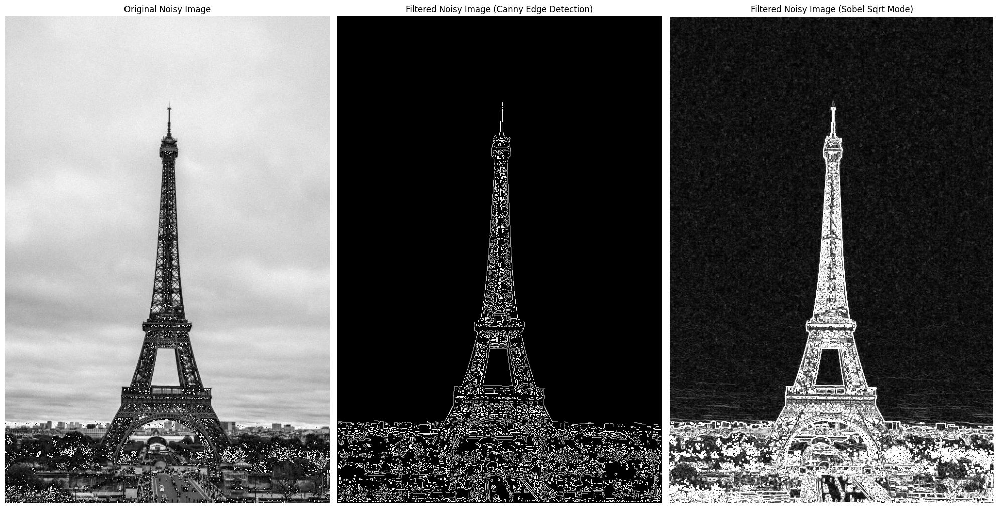

In [46]:
#TODO: apply the filter to the image
canny_noisy_image = canny_edge_detection(noisy_image)
sobel_noisy_image = sobel_edge_detection(noisy_image, 'sqrt')

fig, axs = plt.subplots(1,3, figsize=(20, 20)) # use these figure and axes to show the images

#TODO: show the original image and the filtered images
axs[0].imshow(noisy_image, cmap='gray')
axs[0].set_title('Original Noisy Image')
axs[0].axis('off')

axs[1].imshow(canny_noisy_image, cmap='gray')
axs[1].set_title('Filtered Noisy Image (Canny Edge Detection)')
axs[1].axis('off')

axs[2].imshow(sobel_noisy_image, cmap='gray')
axs[2].set_title('Filtered Noisy Image (Sobel Sqrt Mode)')
axs[2].axis('off')

plt.tight_layout()
plt.show()

<div dir=rtl>
<p>
<font face="B Mitra" size=4>
به نظر شما کدام الگوریتم عملکرد بهتری داشته است؟ چرا؟
</p>
</font>
</div>

<div dir=rtl>
<p>
<font face="B Mitra" size=5, color='cyan'>
الگوریتم Canny عملکرد بهتری نسبت به الگوریتم Sobel در شناسایی لبه‌ها در تصویر نویزی دارد. در الگوریتم Canny لبه‌های تصویر به وضوح و دقت بسیار بیشتری نمایش داده شده‌اند و نویز به حداقل رسیده است، در حالی که در الگوریتم Sobel لبه‌های تصویر به خوبی شناسایی شده‌اند، اما نویز بیشتری در تصویر نهایی مشاهده می‌شود. دلیل برتری الگوریتم Canny به مراحل دقیق‌تر و مؤثرتر آن برای کاهش نویز، نازک‌تر کردن لبه‌ها، و جداسازی لبه‌های قوی و ضعیف برمی‌گردد. در حالی که الگوریتم Sobel به نویز و تغییرات شدت نور حساس‌تر است و نویز بیشتری را به‌عنوان لبه شناسایی می‌کند. بنابراین، الگوریتم Canny لبه‌های دقیق‌تر و واضح‌تری را با نویز کمتر خروجی می‌دهد.
</p>
</font>
</div>
<hr>